In [22]:
!pip install -q git+https://github.com/facebookresearch/segment-anything.git
!pip install -q transformers timm einops ftfy
!pip install -q opencv-python-headless pillow matplotlib requests tqdm

  Preparing metadata (setup.py) ... done


In [23]:
import torch
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


Using device: cpu


In [24]:
import os, requests
from pathlib import Path

os.makedirs("/content/data", exist_ok=True)

IMG_URL = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg"
VID_URL = "https://sample-videos.com/video123/mp4/240/big_buck_bunny_240p_10mb.mp4"

IMG_PATH = "/content/data/input.jpg"
VID_PATH = "/content/data/input_video.mp4"

# Download image
if not Path(IMG_PATH).exists():
    r = requests.get(IMG_URL, stream=True)
    with open(IMG_PATH, "wb") as f:
        for chunk in r.iter_content(1024):
            f.write(chunk)
    print("Downloaded sample image.")

# Download video
if not Path(VID_PATH).exists():
    r = requests.get(VID_URL, stream=True)
    with open(VID_PATH, "wb") as f:
        for chunk in r.iter_content(8192):
            f.write(chunk)
    print("Downloaded sample video.")


In [25]:
from huggingface_hub import login

hf_token = "i have removed my hf_token"  # Replace with your actual token
login(token=hf_token)


In [26]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from segment_anything import sam_model_registry, SamPredictor

# Grounding DINO model
MODEL_ID = "IDEA-Research/grounding-dino-tiny"  # fast for CPU
processor = AutoProcessor.from_pretrained(MODEL_ID)
model = AutoModelForZeroShotObjectDetection.from_pretrained(MODEL_ID).to(DEVICE)

# SAM model
os.makedirs("/content/models", exist_ok=True)
SAM_PATH = "/content/models/sam_vit_b_01ec64.pth"
if not Path(SAM_PATH).exists():
    !wget -q -O {SAM_PATH} https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
    print("SAM checkpoint downloaded.")

sam = sam_model_registry["vit_b"](checkpoint=SAM_PATH)
sam.to(DEVICE)
predictor = SamPredictor(sam)


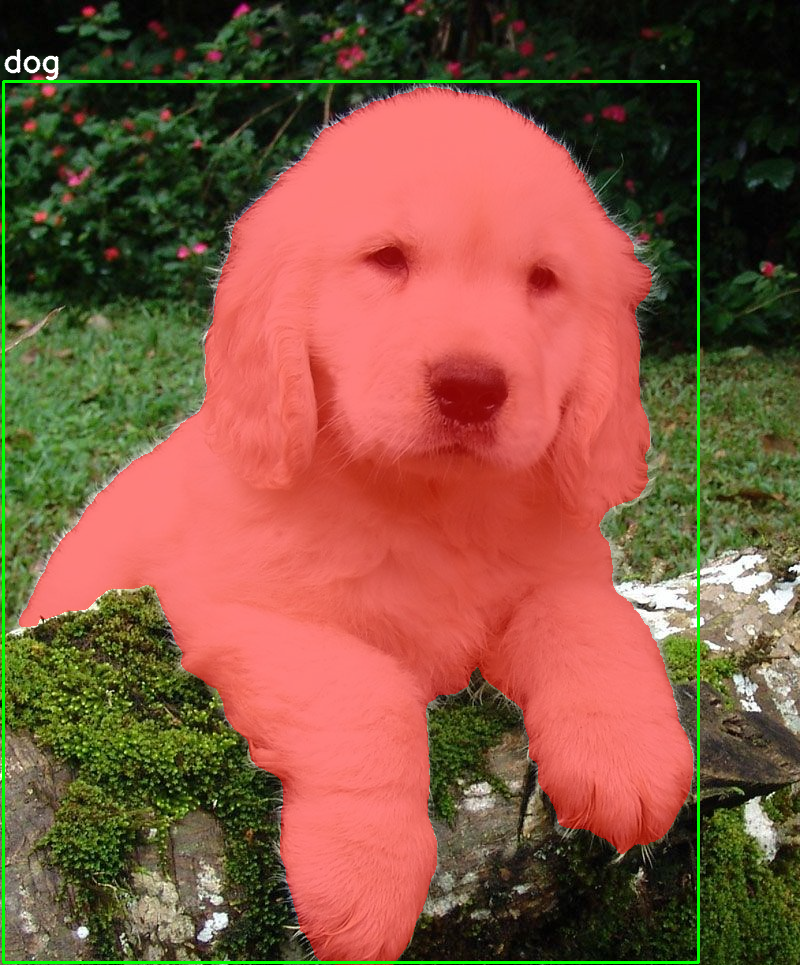

In [27]:
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_np = cv2.imread(IMG_PATH)[:, :, ::-1]  # BGR->RGB
image_pil = Image.open(IMG_PATH).convert("RGB")
prompt = "dog"  # change prompt as desired

# Run DINO detection
inputs = processor(images=image_pil, text=prompt, return_tensors="pt").to(DEVICE)
with torch.no_grad():
    outputs = model(**inputs)
results = processor.post_process_grounded_object_detection(outputs, inputs["input_ids"], target_sizes=[img_np.shape[:2]])
res = results[0]

boxes = res["boxes"].cpu().numpy()
scores = res["scores"].cpu().numpy()
labels = res.get("text_labels", [])
keep = scores > 0.25
boxes = boxes[keep]
labels = [labels[i] for i in range(len(labels)) if keep[i]]

img_overlay = img_np.copy()
if len(boxes) > 0:
    predictor.set_image(img_np)
    for i, box in enumerate(boxes):
        box_array = box.reshape(1, 4).astype(float)
        masks, scores_sam, _ = predictor.predict(box=box_array, multimask_output=True)
        best_mask = masks[int(np.argmax(scores_sam))]
        # overlay mask
        img_overlay[best_mask] = img_overlay[best_mask] * 0.5 + np.array([255, 0, 0]) * 0.5
        # draw box
        x0, y0, x1, y1 = map(int, box)
        cv2.rectangle(img_overlay, (x0, y0), (x1, y1), (0, 255, 0), 2)
        # label
        cv2.putText(img_overlay, labels[i], (x0, max(0, y0 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

# Show result
Image.fromarray(img_overlay).save("/content/data/output_image.png")
display(Image.fromarray(img_overlay))


In [32]:
#  Video Mask Propagation
import cv2
import torch
import numpy as np
from PIL import Image
from tqdm import tqdm
from IPython.display import HTML
from base64 import b64encode
import os

#device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# ---- Input / output video ----
VID_PATH = "/content/77510-563001938_small.mp4"  # <-- your video path
VID_OUT  = "/content/data/output_video.mp4"

assert os.path.exists(VID_PATH), f"Video not found at {VID_PATH}"

# ---- Detection prompt ----
prompt = "dog"  # object to detect

# ---- Load public GroundingDINO model ----
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

MODEL_ID = "IDEA-Research/grounding-dino-tiny"
processor = AutoProcessor.from_pretrained(MODEL_ID)
model = AutoModelForZeroShotObjectDetection.from_pretrained(MODEL_ID).to(DEVICE)

model.eval()

# ---- Load SAM model ----
from segment_anything import sam_model_registry, SamPredictor

SAM_CHECKPOINT = "/content/models/sam_vit_b_01ec64.pth"  # change if needed
sam = sam_model_registry["vit_b"](checkpoint=SAM_CHECKPOINT)
sam.to(DEVICE)
predictor = SamPredictor(sam)

# ---- Read video ----
cap = cv2.VideoCapture(VID_PATH)
fps = cap.get(cv2.CAP_PROP_FPS) or 25.0
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(VID_OUT, fourcc, fps, (w, h))

ret, first_frame = cap.read()
if not ret:
    raise RuntimeError("Cannot read first frame from video.")

first_rgb = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)

# ---- Resize for detection ----
resize_size = (640, 640)
frame_resized = Image.fromarray(first_rgb).resize(resize_size)
inputs = processor(images=frame_resized, text=prompt, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = model(**inputs)

results = processor.post_process_grounded_object_detection(
    outputs, inputs["input_ids"], target_sizes=[resize_size]
)
res = results[0]

# ---- Scale boxes back to original size ----
boxes = res["boxes"].cpu().numpy()
scores = res["scores"].cpu().numpy()
labels = res.get("text_labels", [])

keep = scores > 0.1  # lower threshold for video
boxes = boxes[keep]
labels = [labels[i] for i in range(len(labels)) if keep[i]]

if len(boxes) == 0:
    print("No objects detected in first frame. Exiting.")
    cap.release()
    out.release()
else:
    # ---- Generate initial mask ----
    predictor.set_image(first_rgb)
    mask_total = np.zeros((h, w), dtype=bool)
    for i, box in enumerate(boxes):
        # scale box to original frame
        x_scale = w / resize_size[0]
        y_scale = h / resize_size[1]
        box_scaled = np.array([
            boxes[i][0]*x_scale, boxes[i][1]*y_scale,
            boxes[i][2]*x_scale, boxes[i][3]*y_scale
        ]).reshape(1,4).astype(float)

        masks, scores_sam, _ = predictor.predict(box=box_scaled, multimask_output=True)
        best_mask = masks[int(np.argmax(scores_sam))]
        mask_total |= best_mask

    label_text = labels[0] if labels else "object"

    prev_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)
    prev_mask = (mask_total.astype(np.uint8)) * 255
    out.write(first_frame)

    # ---- Propagate mask through video ----
    pbar = tqdm(total=int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) - 1)
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        curr_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Optical flow
        flow = cv2.calcOpticalFlowFarneback(prev_gray, curr_gray, None,
                                            0.5, 3, 15, 3, 5, 1.2, 0)
        grid_x, grid_y = np.meshgrid(np.arange(w), np.arange(h))
        map_x = (grid_x + flow[..., 0]).astype(np.float32)
        map_y = (grid_y + flow[..., 1]).astype(np.float32)
        warped_mask = cv2.remap(prev_mask, map_x, map_y, interpolation=cv2.INTER_NEAREST,
                                borderMode=cv2.BORDER_CONSTANT, borderValue=0)

        # Overlay mask
        mask_bool = warped_mask > 127
        frame[mask_bool] = frame[mask_bool] * 0.5 + np.array([0, 0, 255]) * 0.5

        # Draw label
        ys, xs = np.where(mask_bool)
        if len(xs) > 0:
            cv2.putText(frame, label_text, (xs.min(), max(0, ys.min()-10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)

        out.write(frame)
        prev_gray = curr_gray
        prev_mask = warped_mask
        pbar.update(1)
    pbar.close()
    cap.release()
    out.release()
    print("Saved propagated video to:", VID_OUT)

# ---- Display video in Colab ----
def show_video(video_path):
    mp4 = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(f"""<video width=480 controls><source src="{data_url}" type="video/mp4"></video>""")

display(show_video(VID_OUT))


Using device: cpu


100%|██████████| 142/142 [00:36<00:00,  3.91it/s]

Saved propagated video to: /content/data/output_video.mp4
